In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from preparation import scale_numeric, encode_categorical, join_numeric_categorical
from preprocess import treat_NA
from scores import get_scores
from postprocess import eliminate_negatives

In [4]:
df_preprocessed = pd.read_csv('..\df_preprocessed_2015-2019.csv')

In [6]:
numeric_features = [
                    'distance', 'traffic', 'temperature','precipIntensity', 'precipProbability', 'Q',                      'apparentTemperature', 'dewPoint', 'humidity', 'pressure', 'windSpeed', 'windGust',                    'windBearing', 'cloudCover', 'uvIndex', 'visibility','precipAccumulation', 'ozone',                    'Wingspan, ft', 'Length, ft', 'MA_10', 'TO -1', 'TO -2', 'TO -3', 'TO Runway -1',                      'TO Runway -2', 'TO Runway -3'
                    ]

categorical_features = [
                        #'aobt_day', 'aobt_month', 'aobt_hour', 'aobt_minute', 'flight_weekday',                                'flight_hour', 'flight_minute', 'summary', 'Stand', 'Runway', '# Engines',                             'Manufacturer','Wake Category', 'Final',
                        'aobt_year'
                        ]


In [8]:
y_train = df_preprocessed[df_preprocessed['aobt_year'].isin([2015, 2016, 2017, 2018])]['TO']

y_test = df_preprocessed[df_preprocessed['aobt_year'] == 2019]['TO']

In [10]:
df_numeric = scale_numeric(df_preprocessed, numeric_features)
df_categorical = encode_categorical(df_preprocessed, categorical_features)
df_prepared = join_numeric_categorical(df_numeric, df_categorical)
#df_prepared.to_csv('df_prepared.csv')

In [12]:
train = df_prepared[(df_prepared.aobt_year_2015 == 1) | (df_prepared.aobt_year_2016 == 1) |                                (df_prepared.aobt_year_2017 == 1) | (df_prepared.aobt_year_2018 == 1)]
test = df_prepared[df_prepared.aobt_year_2019 == 1]

X_train = train.loc[:, train.columns != 'TO'].drop(['aobt_year_2015', 'aobt_year_2016',                                                                    'aobt_year_2017', 'aobt_year_2018',                                                                    'aobt_year_2019'], axis = 1)
X_test = test.loc[:, test.columns != 'TO'].drop(['aobt_year_2015', 'aobt_year_2016','aobt_year_2017', 
                                                 'aobt_year_2018', 'aobt_year_2019'], axis = 1)

In [14]:
X_test = treat_NA(X_test)

In [16]:
regr = LinearRegression()
regr.fit(X_train,y_train)
y_pred=regr.predict(X_test)
y_pred = eliminate_negatives(y_pred)

In [18]:
# The coefficients
print('Coefficients: \n', regr.coef_.sort())

scores = get_scores(y_test.to_numpy(), y_pred, metrics=['rmse','mae','r2','first_quartile_error','third_quartile_error'])
for k,v in scores.items():
    print("{}:\n{:0.2f}".format(k,v))

Coefficients: 
 None
[393.77732901 199.79600908 344.75215528 ... 206.0791274  199.9187904
 343.914134  ]
rmse:
436.64
mae:
250.70
r2:
0.23
first_quartile_error:
82.29
third_quartile_error:
306.82


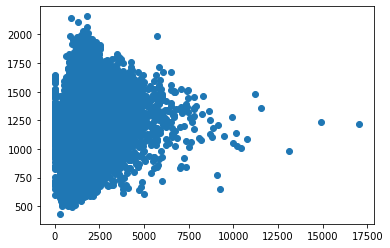

In [19]:
plt.scatter(y_test, y_pred)